##  Cat vs Dog Classification

In [3]:
# 필요없는 경고 메시지 무시
import warnings
warnings.filterwarnings("ignore")

## Load Data

In [4]:
import tensorflow_datasets as tfds
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)
#split=['train[:80%]', 'train[80%:90%]', 'train[90%:]']
#전체 train 데이터셋으로 설정되어 있는 데이터셋을,
#80%, 10%, 10% 세 부분으로 나누어 각각 train_data, validation_data, test_data로 사용하겠다는 의미

In [5]:
#데이터 확인
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


## Image load using matplolib

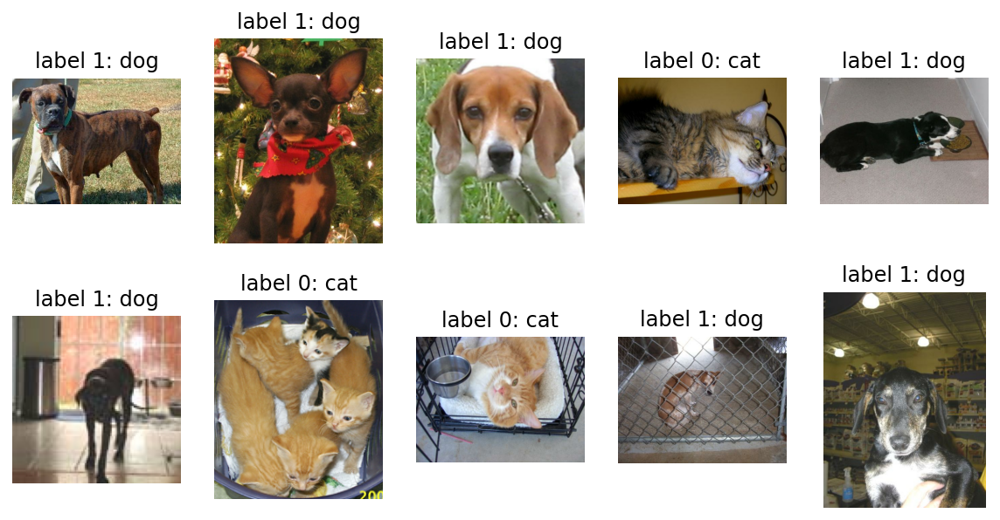

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

## Image resize

In [7]:
import tensorflow as tf
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

## Resize Image Load

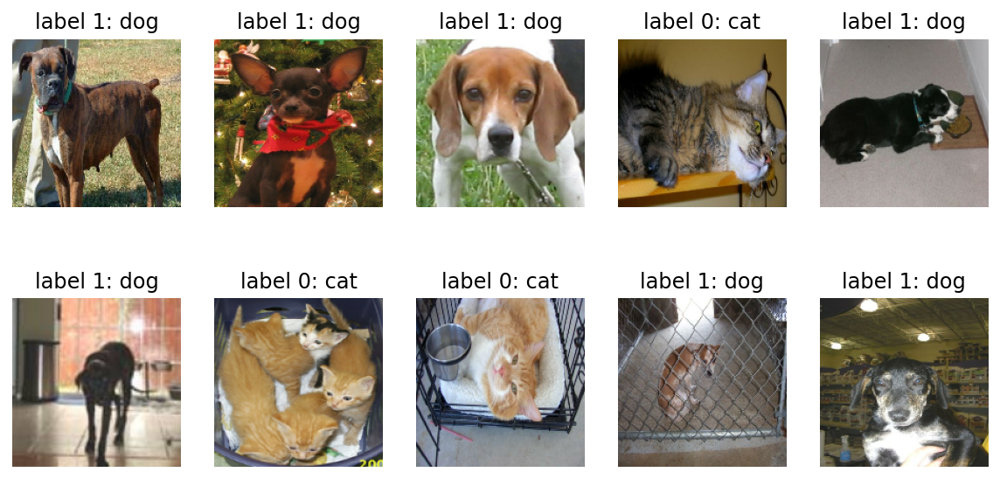

In [8]:
plt.figure(figsize=(10, 5))
#image shape (160, 160, 3)

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

## Model Design

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
# layers -> 모델의 구성요소인 여러가지 layer가 있음
# models -> 연속적으로 모델을 쌓기 위해
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

## Batch Setting

In [10]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape


(TensorShape([32, 160, 160, 3]), TensorShape([32]))

image_batch의 shape는 (160, 160, 3)의 shape인 32개의 데이터가 존재한다는 뜻이다. 즉, 데이터 하나의 크기는 (160, 160, 3)이고, 그 개수가 32개이다.

label은 강아지이면 1, 고양이이면 0으로 정답 label을 나타내기 때문에 한 batch에 데이터가 32개라면 label은 0 또는 1의 32개의 숫자로만 구성된다.

## evaluate before training

In [9]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 0s 15ms/step - loss: 0.7137 - accuracy: 0.4734
initial loss: 0.71
initial accuracy: 0.47


## Training My Model

In [10]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 23s 39ms/step - loss: 0.5871 - accuracy: 0.6801 - val_loss: 0.5472 - val_accuracy: 0.7248
Epoch 2/10
582/582 [==============================] - 23s 39ms/step - loss: 0.4692 - accuracy: 0.7771 - val_loss: 0.4862 - val_accuracy: 0.7760
Epoch 3/10
582/582 [==============================] - 22s 37ms/step - loss: 0.4025 - accuracy: 0.8182 - val_loss: 0.4558 - val_accuracy: 0.7971
Epoch 4/10
582/582 [==============================] - 22s 38ms/step - loss: 0.3452 - accuracy: 0.8481 - val_loss: 0.4639 - val_accuracy: 0.7962
Epoch 5/10
582/582 [==============================] - 22s 38ms/step - loss: 0.2914 - accuracy: 0.8773 - val_loss: 0.4642 - val_accuracy: 0.7997
Epoch 6/10
582/582 [==============================] - 22s 38ms/step - loss: 0.2407 - accuracy: 0.9038 - val_loss: 0.5521 - val_accuracy: 0.7846
Epoch 7/10
582/582 [==============================] - 23s 39ms/step - loss: 0.1975 - accuracy: 0.9250 - val_loss: 0.4928 - val_accuracy:

## Visualization training & loss

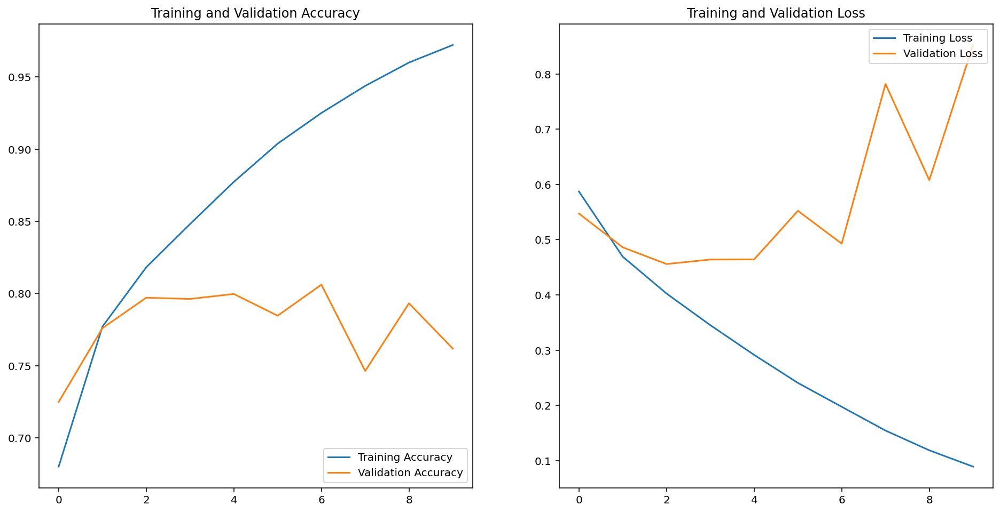

In [11]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## model prediction

In [12]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9995291e-01, 4.7100373e-05],
       [9.0120471e-01, 9.8795325e-02],
       [2.0374236e-01, 7.9625767e-01],
       [9.9999869e-01, 1.3660527e-06],
       [9.8165220e-01, 1.8347776e-02],
       [5.6022590e-01, 4.3977410e-01],
       [1.3893388e-01, 8.6106616e-01],
       [4.2625085e-01, 5.7374913e-01],
       [7.1522832e-01, 2.8477165e-01],
       [4.8221233e-01, 5.1778764e-01],
       [9.5324117e-01, 4.6758868e-02],
       [9.9632037e-01, 3.6796380e-03],
       [9.9693155e-01, 3.0684657e-03],
       [8.9823885e-04, 9.9910176e-01],
       [9.9839967e-01, 1.6003044e-03],
       [9.9986792e-01, 1.3206451e-04],
       [4.4243103e-01, 5.5756897e-01],
       [2.6439276e-01, 7.3560721e-01],
       [9.5277441e-01, 4.7225602e-02],
       [9.9999964e-01, 3.8620092e-07],
       [9.1005683e-01, 8.9943178e-02],
       [9.9869424e-01, 1.3057714e-03],
       [9.9999881e-01, 1.1989207e-06],
       [9.8800927e-01, 1.1990675e-02],
       [9.9791461e-01, 2.0853817e-03],
       [9.1170472e-01, 8.

In [13]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

## Visualization predict result

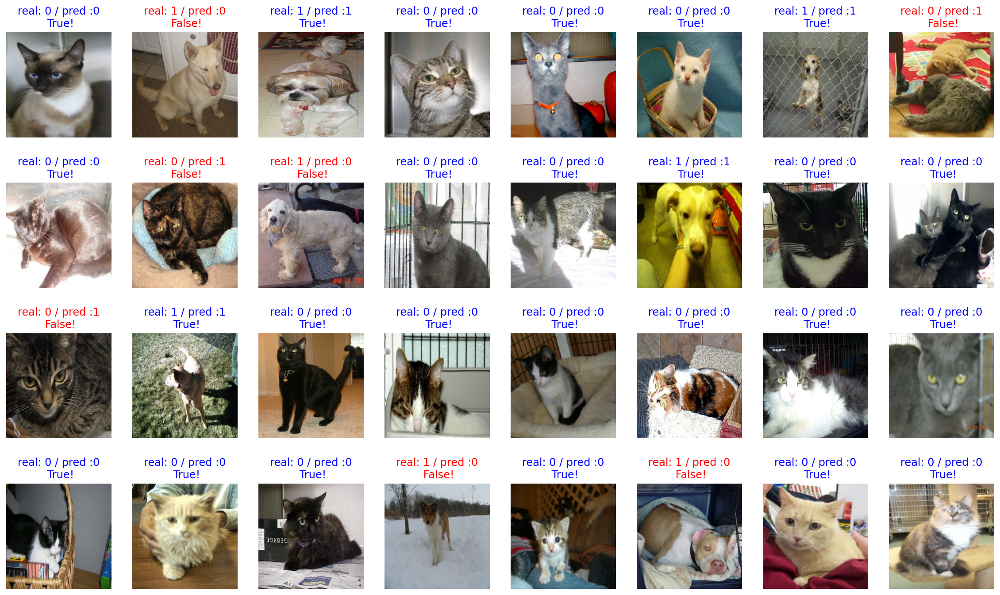

In [14]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [15]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
      correct = label == prediction
      if correct:
        count = count + 1


print(count / 32 * 100)    # 약 70% 내외

78.125


## Transfer learning cat vs Dog

In [11]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         # 가까운 높은 레벨에 있는 3개의 FC 레이어는 제외하고 불러와야 하므로
                                         include_top=False,
                                         weights='imagenet')
# 기존 image data 형태
image_batch.shape

TensorShape([32, 160, 160, 3])

In [12]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [13]:
# VGG16 모델 확인
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

이미지 삽입 방법
 
1. 코드블럭 안에 삽입하는 법

Image("파일경로/파일명.확장자명")

ex) Image("img/picture.png")

2. markdown 안에 삽입하는 법

!이미지이름?](파일경로/파일명.확장자명)

ex) !nn](img/99.01_01.png)
![VGG_Model](VGG.png)


## Custormize model

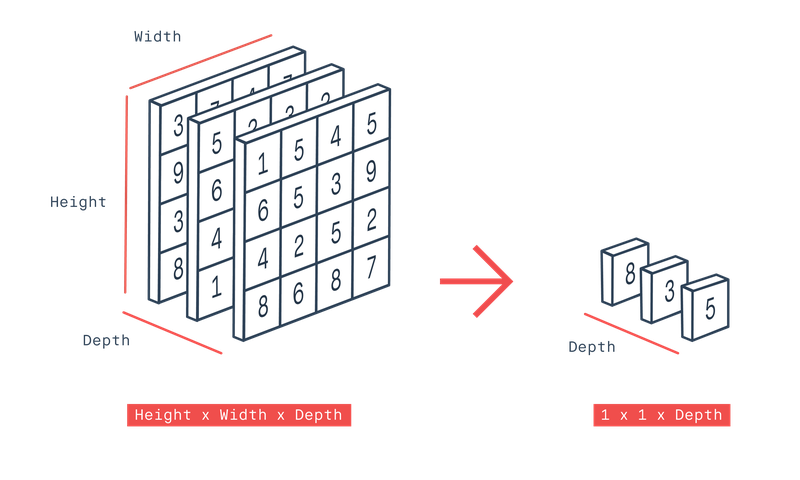

In [14]:
'''
VGG16 모델을 거치고 나온 Shape는 TensorShape([32, 5, 5, 512])
이를 Flat하게 만들어 줘야하는데
2차원 또는 3차원 벡터를 1차원으로 축소시키는 방법에는 Flattening 하는 것보다 조금 더 좋은 방법
바로 Global Average Pooling
'''
from IPython.display import Image
Image("Google_average_pooling.png")


In [15]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 512)
(32, 2)


In [16]:
#VGG16 base 모델은 W값 수정 X
base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [17]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 72ms/step - loss: 0.7942 - accuracy: 0.4703
initial loss: 0.79
initial accuracy: 0.47


In [18]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 55s 95ms/step - loss: 0.2569 - accuracy: 0.9066 - val_loss: 0.1750 - val_accuracy: 0.9316
Epoch 2/5
582/582 [==============================] - 53s 92ms/step - loss: 0.1609 - accuracy: 0.9353 - val_loss: 0.1521 - val_accuracy: 0.9398
Epoch 3/5
582/582 [==============================] - 51s 88ms/step - loss: 0.1465 - accuracy: 0.9397 - val_loss: 0.1477 - val_accuracy: 0.9433
Epoch 4/5
582/582 [==============================] - 53s 91ms/step - loss: 0.1393 - accuracy: 0.9416 - val_loss: 0.1395 - val_accuracy: 0.9407
Epoch 5/5
582/582 [==============================] - 46s 80ms/step - loss: 0.1336 - accuracy: 0.9448 - val_loss: 0.1377 - val_accuracy: 0.9415


## Visualization

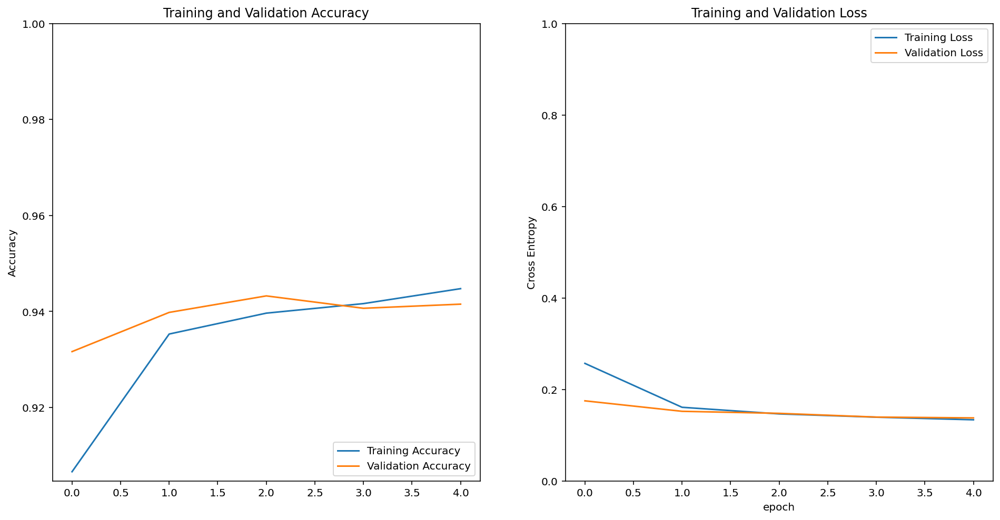

In [19]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [20]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9999428e-01, 5.6951080e-06],
       [1.5543340e-01, 8.4456658e-01],
       [3.2715803e-01, 6.7284197e-01],
       [9.9999785e-01, 2.1654896e-06],
       [9.9836963e-01, 1.6303407e-03],
       [9.9132818e-01, 8.6718695e-03],
       [1.8433071e-04, 9.9981564e-01],
       [7.0470273e-01, 2.9529724e-01],
       [9.6034163e-01, 3.9658394e-02],
       [9.6491033e-01, 3.5089687e-02],
       [8.1958147e-05, 9.9991798e-01],
       [9.9996877e-01, 3.1258798e-05],
       [9.8948228e-01, 1.0517701e-02],
       [8.7171511e-06, 9.9999130e-01],
       [9.9885154e-01, 1.1484256e-03],
       [9.8872745e-01, 1.1272587e-02],
       [9.9656302e-01, 3.4369617e-03],
       [2.6381047e-02, 9.7361892e-01],
       [6.3689595e-01, 3.6310408e-01],
       [9.9594218e-01, 4.0578130e-03],
       [9.3057841e-01, 6.9421567e-02],
       [9.8017704e-01, 1.9822963e-02],
       [9.9409556e-01, 5.9043700e-03],
       [9.7647196e-01, 2.3528067e-02],
       [9.9895775e-01, 1.0422351e-03],
       [9.8725373e-01, 1.

In [21]:
#라벨 변환
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

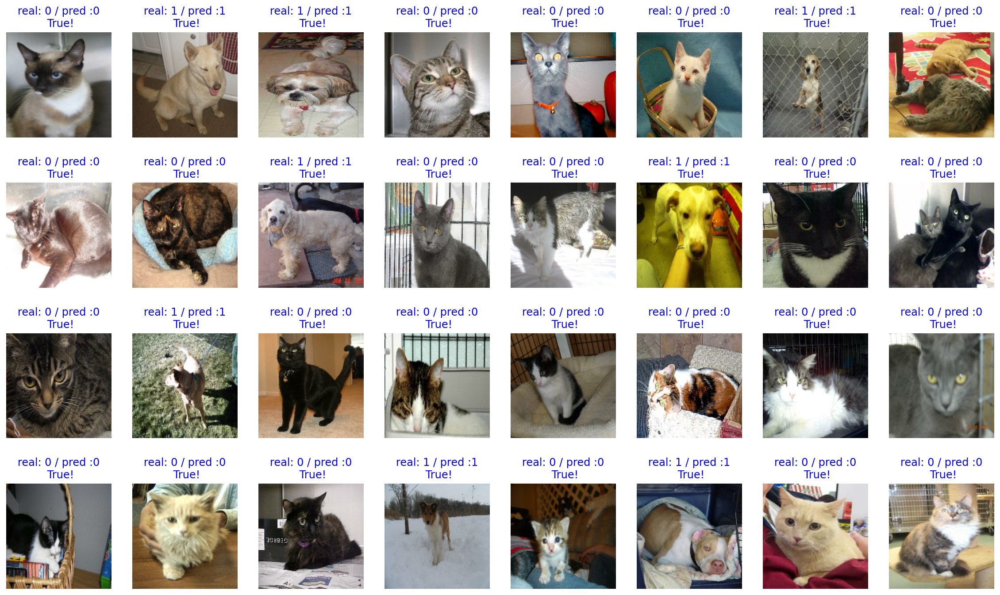

In [22]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [24]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print('{}%'.format(count / 32 * 100)) # 약 95% 내외

100.0%


In [27]:
import os

checkpoint_dir = os.getenv("HOME") + "/project/AIFFEL_Study/e4_image_classifier/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


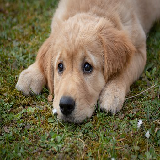

In [28]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
img_dir_path = os.getenv("HOME") + "/project/AIFFEL_Study/e4_image_classifier/cat_vs_dog/images"
os.path.exists(img_dir_path)

IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [29]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [30]:
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

## make predict_image Func

In [31]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100% dog, and 0% cat.


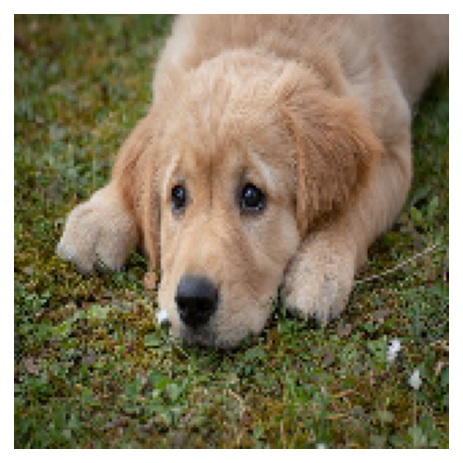

In [32]:
filename = 'my_dog.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


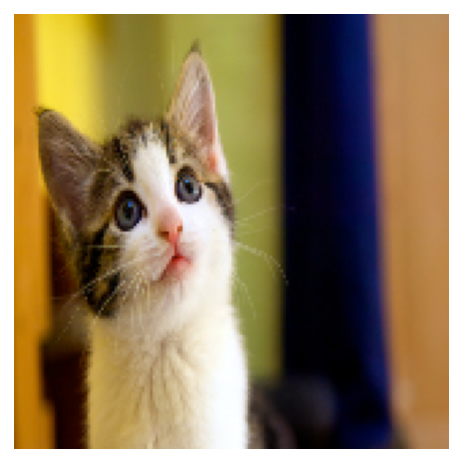

In [33]:
filename = 'my_cat.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


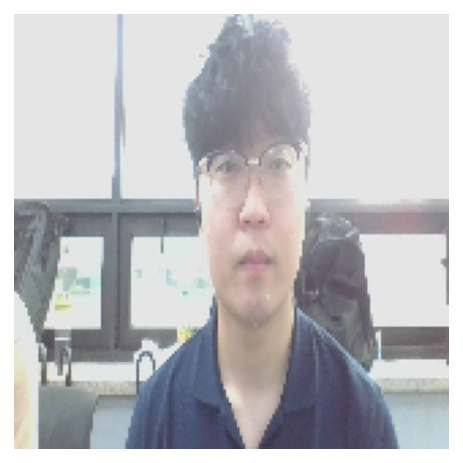

In [34]:
filename = "my_face.jpg"
show_and_predict_image(img_dir_path, filename)